# End to end multi class dog breed classification:

This notebook builds an end to end image classifier using tensorflow 2.0 and tensorflow hub.

# 1.Problem:

Identify the breed of the dog.

# 2. Data

In the form of images. The data being used is from kaggle.

# 3. Evaluation

it is a file with prediction possibility for each dog breed of each test image.

# 4. Features

Info:
* It is unstructured
* there are 120 dog breeds therefore there are 120 classes.
* There are 10k+ images in train and 10k+ images are there in test set. * Train set have labels, test set do not have labels.

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

### Get the workspace ready:

* import tf
* import tf hub
* make sure we are using a GPU

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

In [ ]:
import tensorflow_hub as hub

print("TF hub version:", hub.__version__)

# check for gpu availability:
print("GPU", "Available (Yesss!!!)" if tf.config.list_physical_devices("GPU") else "not available")

TF hub version: 0.13.0
GPU Available (Yesss!!!)


## Getting our data ready:

All images to be turned to tensors(num representation)
lets start by accessing labels

In [ ]:
!unzip "drive/MyDrive/Dog vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog vision/"

Streaming output truncated to the last 5000 lines.
  inflating: drive/MyDrive/Dog vision/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: drive/MyDrive/Dog vision/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: drive/MyDrive/Dog vision/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: drive/MyDrive/Dog vision/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: drive/MyDrive/Dog vision/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: drive/MyDrive/Dog vision/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: drive/MyDrive/Dog vision/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: drive/MyDrive/Dog vision/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: drive/MyDrive/Dog vision/train/83fad0718581a696132c96c166472627.jpg  
  inflating: drive/MyDrive/Dog vision/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: drive/MyDrive/Dog vision/train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: drive/MyDrive/Dog visio

In [ ]:
labels_csv = pd.read_csv("drive/MyDrive/Dog vision/labels.csv")

print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

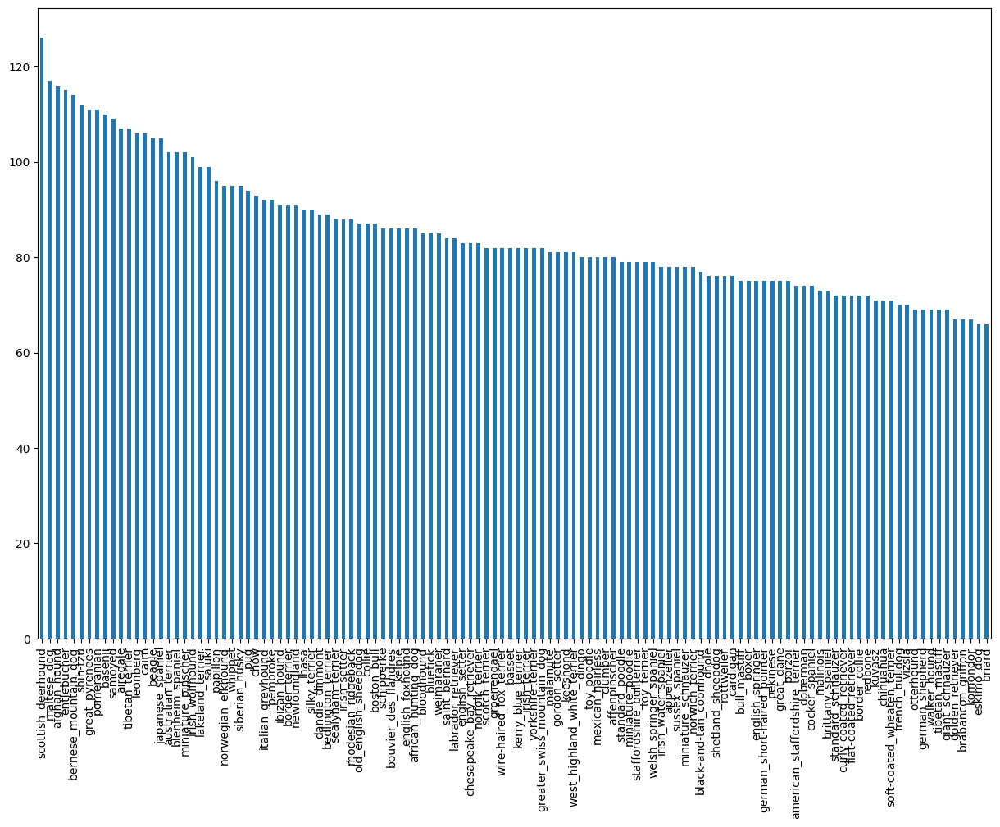

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(15,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

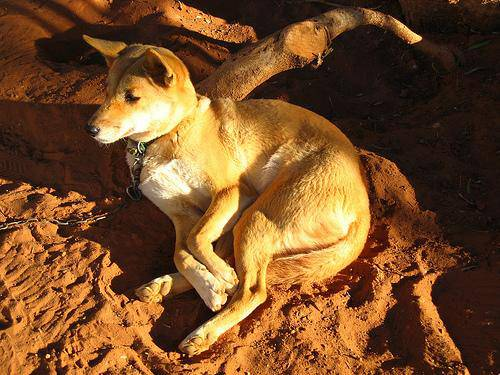

In [ ]:
# lets view an image->
from IPython.display import Image
Image("drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels:

Lets get all of our image file pathnames.

In [ ]:
filenames = ["drive/MyDrive/Dog vision/train/"+fname + ".jpg" for fname in labels_csv["id"]]

filenames

['drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/Dog vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/Dog vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/Dog vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/Dog vision/train/006cc3ddb9dc1bd827479569fcdc52d

In [ ]:
import os
if(len(os.listdir("drive/MyDrive/Dog vision/train/"))== len(filenames)):
  print("numbers matching")
else:
  print("does not match")

numbers matching


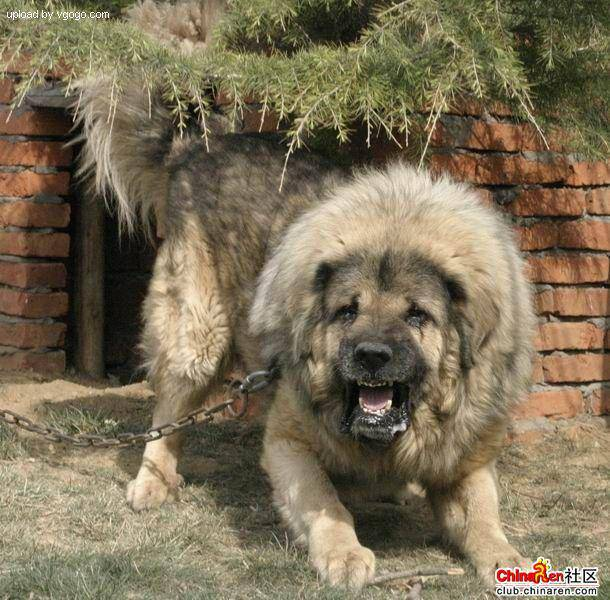

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we have now gotten our training image filepaths in a list, prepare our labels.

In [ ]:
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
if(len(labels)== len(filenames)):
  print("numbers matching")
else:
  print("does not match")

numbers matching


In [ ]:
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
bool_labels = [label == unique_breeds for label in labels]
bool_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# example: turning bool arrays to integers:

print(labels[0])
print(np.where(unique_breeds == labels[0])) #index where label occurs
print(bool_labels[0].argmax())
print(bool_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating out own validation set:

kaggle doesnt provide us with one so we till train_test_split

In [ ]:
X = filenames
y = bool_labels

Start of experimenting with a thousand images and increase as needed.

In [ ]:
# set no of images to use for experimenting

NUM_IMAGES = 10000 #@param {type:"slider", min:1000,max:10000, step:1000}

In [ ]:
# lets split our data into train and valid:

from sklearn.model_selection import train_test_split

X_train, X_val, y_train,y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2,random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(8000, 8000, 2000, 2000)

In [ ]:
# lets  have a geez at training data

X_train[:5], y_train[:2]

(['drive/MyDrive/Dog vision/train/e86be20abe3ab746179728fa6f19bc59.jpg',
  'drive/MyDrive/Dog vision/train/269a6aeefd8050aafda02044c9cd2a80.jpg',
  'drive/MyDrive/Dog vision/train/2974dccc97c0cb25f7873e33a4730f47.jpg',
  'drive/MyDrive/Dog vision/train/99b31cac1b20997c30d49cd6a2d9cde4.jpg',
  'drive/MyDrive/Dog vision/train/a7702c83da79d54e27d2e9b1f01fe64e.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
          True, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

In [ ]:
X

['drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/Dog vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/Dog vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/Dog vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/Dog vision/train/006cc3ddb9dc1bd827479569fcdc52d

## Preprocessing images-> (turning images into tensors)

to preprocess our images to tensors, write a function:
1. take input as filepath
2. use tf to read the file and save it to a variable 'image'
3. turn our 'image' (a jpg) into tensors
4. normalize the image i.e. convert the scale from 0-255 to 0-1
5. Resize the image to be a shape of (224,224)
6. Return the modefied image

Before we do lets see what an image looks like.

In [ ]:
from matplotlib.pyplot import imread

image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min() #red blue and green combos

(255, 0)

In [ ]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

In [ ]:
image = imread(filenames[6900])
image.shape

(225, 300, 3)

In [ ]:
image

array([[[ 79,  70,  29],
        [ 71,  64,  22],
        [ 62,  55,   9],
        ...,
        [ 48,  45,  28],
        [ 48,  45,  28],
        [ 48,  45,  28]],

       [[ 57,  50,   8],
        [ 61,  54,  10],
        [ 66,  62,  15],
        ...,
        [ 42,  39,  22],
        [ 45,  42,  25],
        [ 49,  46,  29]],

       [[ 47,  40,   0],
        [ 60,  53,   9],
        [ 77,  73,  26],
        ...,
        [ 36,  33,  16],
        [ 42,  39,  22],
        [ 47,  44,  27]],

       ...,

       [[155, 145, 135],
        [155, 145, 135],
        [154, 144, 134],
        ...,
        [114, 101,  82],
        [114, 101,  82],
        [114, 101,  82]],

       [[155, 145, 135],
        [155, 145, 135],
        [154, 144, 134],
        ...,
        [116, 103,  84],
        [116, 103,  84],
        [116, 103,  84]],

       [[167, 140, 129],
        [177, 153, 141],
        [172, 150, 137],
        ...,
        [119, 105,  78],
        [115, 101,  74],
        [114, 100,  74]]

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(225, 300, 3), dtype=uint8, numpy=
array([[[ 79,  70,  29],
        [ 71,  64,  22],
        [ 62,  55,   9],
        ...,
        [ 48,  45,  28],
        [ 48,  45,  28],
        [ 48,  45,  28]],

       [[ 57,  50,   8],
        [ 61,  54,  10],
        [ 66,  62,  15],
        ...,
        [ 42,  39,  22],
        [ 45,  42,  25],
        [ 49,  46,  29]],

       [[ 47,  40,   0],
        [ 60,  53,   9],
        [ 77,  73,  26],
        ...,
        [ 36,  33,  16],
        [ 42,  39,  22],
        [ 47,  44,  27]],

       ...,

       [[155, 145, 135],
        [155, 145, 135],
        [154, 144, 134],
        ...,
        [114, 101,  82],
        [114, 101,  82],
        [114, 101,  82]],

       [[155, 145, 135],
        [155, 145, 135],
        [154, 144, 134],
        ...,
        [116, 103,  84],
        [116, 103,  84],
        [116, 103,  84]],

       [[167, 140, 129],
        [177, 153, 141],
        [172, 150, 137],
        ...,
        [119, 105,  7

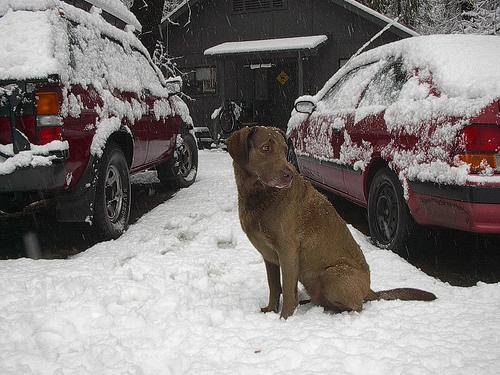

In [ ]:
Image(filenames[10221])

In [ ]:
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

## Turning data into batches:

Lets say, if u try to prcoess 10000+ images in one go, they might not all fit in the memory or could break the system.
Thats y do 32 at a time.

Pass it like tesnor tuples-> (image, label).

In [ ]:
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

Now we have got a way to turn out data into tuples of tensors in for (image,label), lets make a function to turn all data into batches.

In [ ]:
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels
    
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# creating training and valid databatch:

train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
len(y_train)

8000

## Visualize the data:

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
def show_25_images(images, labels):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.38771456, 0.62953   , 0.21388753],
          [0.44761726, 0.6835066 , 0.28956404],
          [0.41887197, 0.64992934, 0.29072067],
          ...,
          [0.47701344, 0.6730918 , 0.4415069 ],
          [0.4231215 , 0.6237168 , 0.35015216],
          [0.37143534, 0.5753569 , 0.2851608 ]],
 
         [[0.35293698, 0.5921089 , 0.18831863],
          [0.4333687 , 0.6686257 , 0.28328326],
          [0.3967735 , 0.62779063, 0.27654937],
          ...,
          [0.23209476, 0.428217  , 0.18815924],
          [0.40981203, 0.6137336 , 0.3301901 ],
          [0.34336874, 0.5472903 , 0.25709423]],
 
         [[0.45766303, 0.6929571 , 0.3094861 ],
          [0.4271351 , 0.658695  , 0.293877  ],
          [0.3880984 , 0.6155494 , 0.28026104],
          ...,
          [0.43152225, 0.6315223 , 0.37001142],
          [0.45688155, 0.6608031 , 0.3772596 ],
          [0.4052339 , 0.6091555 , 0.31895936]],
 
         ...,
 
         [[0.35363021, 0.5871036 , 0.17696966],
          [0.38491

In [ ]:
len(train_images), len(train_labels)

(32, 32)

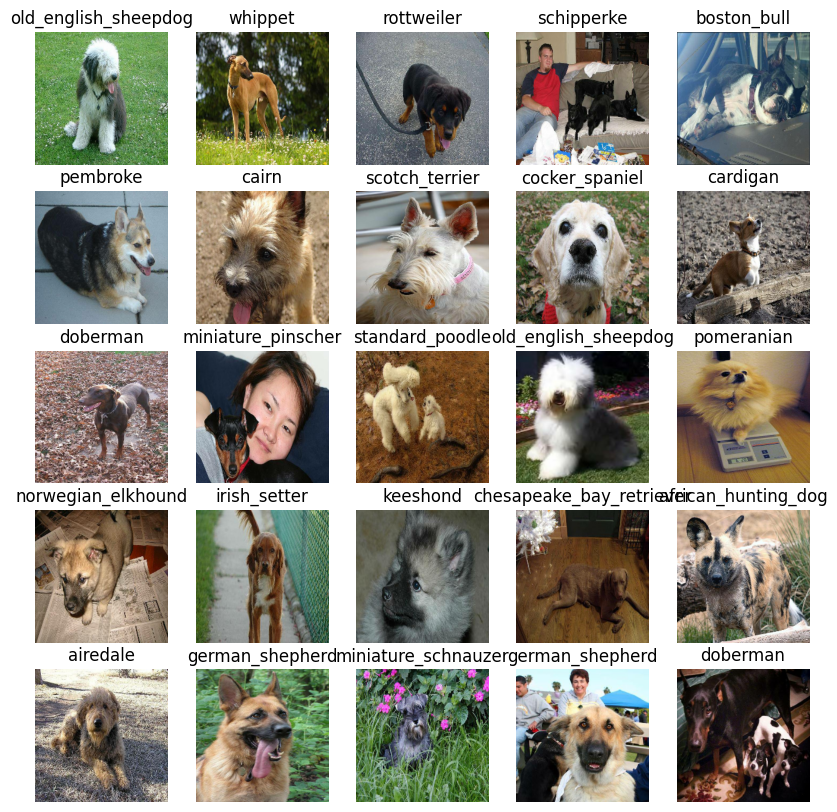

In [ ]:
show_25_images(train_images,train_labels)

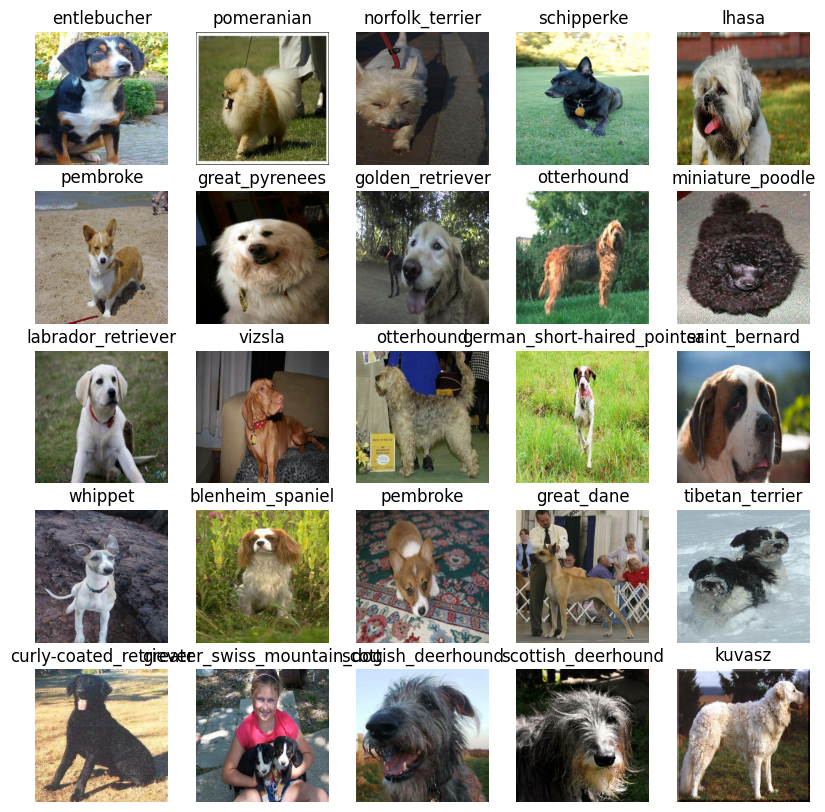

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Getting the input and output ready:

The input shape (images, in the form of Tensors) to our model.
The output shape (image labels, in the form of Tensors) of our model.
The URL of the model we want to use.

In [ ]:
# setup input shape to the model:

INPUT_SHAPE = [None, IMG_SIZE,IMG_SIZE,3]
OUTPUT_SHAPE = len(unique_breeds)

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we have inputs, outputs and model.

Create a function:
* takes the input shape, output shape and the model we have chosen.
* defines the layers in a keras model in sequential fashion
* compiles the model (says how it should be evaluated and improved)
* builds the model
* returns the model

In [ ]:
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  # setup model layers:
  model = tf.keras.Sequential([hub.KerasLayer(model_url),  #layer 1
                               tf.keras.layers.Dense(units= output_shape, activation="softmax")]) #layer 2
  # the second layer is passed in as the output layers since the eventual shape of the final matrix ie the list.
  # compile the model:
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])
  # building the model:
  model.build(INPUT_SHAPE)
  return model

In [ ]:
model = create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks:
callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop early if a model stops improving.

We will create 2 callbacks, 1 for tensorboard which helps track progress and another for early stopping which prevents the model from training for too long.


### Tensorboard callback:
To setup a tensorboard we need to do 3 things:
1. load tensorboard extension
2. create a tensorboard callback that saves logs to a directory and pass ot tp our model's fit() function
3. Visuialize our model training lods with the %tensorboard magic function

In [ ]:
# Load tensorboard notebook extension:

%load_ext tensorboard

In [ ]:
import datetime

def create_tensorboard_callback():
  logdir = os.path.join("drive/MyDrive/Dog vision/logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback:

This is to prevent from overfitting by stopping training if a certain eval metrics stops improving.

In [ ]:
# create early stopping callback:

early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)


## Training a model:

our first model is training only on 1k images to check if everything is fine.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# final check to make sure we are running on gpu

print("GPU", "available (yes!!!!!!)" if tf.config.list_physical_devices("GPU") else "not avaipable:(")

GPU available (yes!!!!!!)


Lets create a function which creates a model

* Create a model using 'creat_model()
* Setup tensorboard callbacks
* call the fit() function on our model by passing training data, validation data and the number of epochs to train for ('NUM_EPOCHS')
* Return the model

In [ ]:
from keras.callbacks import TensorBoard
def train_model():
  # create a model
  model = create_model()
  # create new tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # fit the model to the data passing it the callbacks we created
  model.fit(x=train_data, epochs=NUM_EPOCHS, 
            validation_data = val_data, 
            validation_freq=1, callbacks = [tensorboard, early_stopping],
            validation_steps = len(val_data))
  return model

In [ ]:
model = train_model()

Epoch 1/100
250/250 [==============================] - 51s 145ms/step - loss: 1.5241 - accuracy: 0.6331 - val_loss: 0.7004 - val_accuracy: 0.7915
Epoch 2/100
250/250 [==============================] - 31s 125ms/step - loss: 0.4129 - accuracy: 0.8784 - val_loss: 0.6459 - val_accuracy: 0.8050
Epoch 3/100
250/250 [==============================] - 31s 124ms/step - loss: 0.2356 - accuracy: 0.9411 - val_loss: 0.6438 - val_accuracy: 0.8055
Epoch 4/100
250/250 [==============================] - 33s 130ms/step - loss: 0.1447 - accuracy: 0.9699 - val_loss: 0.6483 - val_accuracy: 0.8080
Epoch 5/100
250/250 [==============================] - 31s 125ms/step - loss: 0.1004 - accuracy: 0.9818 - val_loss: 0.6461 - val_accuracy: 0.8065
Epoch 6/100
250/250 [==============================] - 31s 124ms/step - loss: 0.0738 - accuracy: 0.9890 - val_loss: 0.6641 - val_accuracy: 0.8085
Epoch 7/100
250/250 [==============================] - 36s 145ms/step - loss: 0.0540 - accuracy: 0.9951 - val_loss: 0.6703 -

## Checking the tensor board logs:

The tensor board magic function '%tensorboard' will access the logs directory and visulaize its contents/

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using the trained model

In [ ]:
# make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

63/63 [==============================] - 11s 94ms/step


array([[4.73581041e-09, 5.62605379e-11, 6.90152024e-09, ...,
        9.88777615e-10, 1.09821492e-07, 3.58635815e-10],
       [2.20261541e-07, 4.27080993e-09, 2.80114182e-10, ...,
        1.89968961e-11, 4.68293071e-10, 8.82674289e-09],
       [5.07725112e-04, 4.98884583e-06, 3.11469121e-05, ...,
        1.13447982e-06, 1.36663613e-04, 7.56898941e-03],
       ...,
       [8.15302847e-05, 2.91179640e-05, 1.44060459e-06, ...,
        2.88950050e-05, 4.90505590e-06, 8.67757015e-03],
       [2.20440796e-07, 1.33871554e-08, 1.37571075e-08, ...,
        4.30291522e-07, 5.76004328e-04, 1.75057941e-08],
       [3.83991846e-07, 1.46631046e-05, 6.08654127e-10, ...,
        7.34004746e-10, 2.72093848e-06, 1.13244496e-05]], dtype=float32)

In [ ]:
predictions.shape

(2000, 120)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Prediction label: {unique_breeds[np.argmax(predictions[index])]}")

[4.73581041e-09 5.62605379e-11 6.90152024e-09 2.65118327e-09
 7.48211221e-07 6.17542464e-05 1.38778065e-08 1.81894507e-06
 1.24893351e-09 5.65496566e-06 1.02220650e-08 4.29229701e-08
 1.87819481e-07 1.22616131e-08 9.23875532e-10 1.06076368e-06
 1.51752459e-08 3.17477173e-08 1.39824499e-10 4.00027833e-09
 1.02912096e-10 7.76244069e-10 4.37998393e-09 5.51660453e-11
 1.11417819e-07 1.03313216e-08 3.62074259e-11 1.59806017e-08
 3.33689232e-09 3.14379167e-09 1.12901981e-08 1.94465177e-09
 6.87733412e-11 5.17437315e-10 1.45008205e-09 1.06990541e-08
 4.07574952e-08 3.60625030e-10 1.57074513e-08 3.31335997e-07
 5.06410081e-10 3.93397641e-11 9.99912977e-01 6.42183267e-08
 9.83045978e-10 1.03985875e-10 2.16347662e-10 3.90324495e-10
 6.48177956e-10 2.17308688e-11 1.43776313e-09 1.03129824e-10
 9.32961597e-10 1.15543389e-05 1.69858252e-10 2.59222503e-07
 9.78369052e-11 5.52121543e-11 2.59652733e-11 5.54813452e-11
 3.63652641e-09 3.19553664e-08 3.11282861e-10 1.33196583e-08
 3.07346770e-09 5.336655

Having the above functionality is great but we want to be able to do it at a scale.

And it would be even better if we could see the image the prediction is being made on.

**Note:** prediction probability are also known as confidence levels.

In [ ]:
# turn proba into their respective label;

def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

# get a predicted label based on an array of prediction probabilities

pred_label = get_pred_label(predictions[69])

In [ ]:
pred_label

'schipperke'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Since the validation is still in a batch dataset, we will have to unbatch it to make predictions on the validation images and then compare those predictions to the validation lables.

In [ ]:
# create a function to unbatch:

images_ = []
labels_ = []
# loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

In [ ]:
get_pred_label(labels_[0])

'entlebucher'

In [ ]:
get_pred_label(predictions[0])

'entlebucher'

In [ ]:
from tensorflow.python.ops.batch_ops import unbatch
def unbatchify(data):
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

val_img, val_lab = unbatchify(val_data)

In [ ]:
len(predictions)

2000

In [ ]:
# create a function to visualize and plot the predict label, 
# its predicted probability, the truth label and the target image on a single plot.

def plot_pred(prediction_probabilities, lables,images, n=69):
  pred_proba, true_label, image = prediction_probabilities[n], lables[n], images[n]
  pred_label = get_pred_label(pred_proba)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  # change colour of the title bsed on if the prediction is right or wrong:
  if(pred_label== true_label):
    color= "green"
  else:
    color = "red"
  plt.title("{} {:2.0f} {}".format(pred_label, np.max(pred_proba)*100, true_label), color = color)

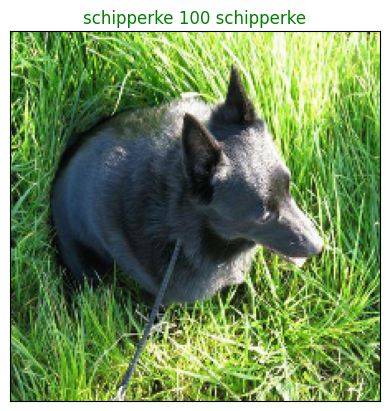

In [ ]:
plot_pred(predictions, val_lab, val_img)

In [ ]:
def plot_pred_conf(prediction_proba, labels, n=1):
  pred_prob, true_label = prediction_proba[n], labels[n]
  pred_label = get_pred_label(pred_prob)

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # find the highest confidence now:
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  #  find the top 10 prediction labels:
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)), labels = top_10_pred_labels, rotation="vertical")
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

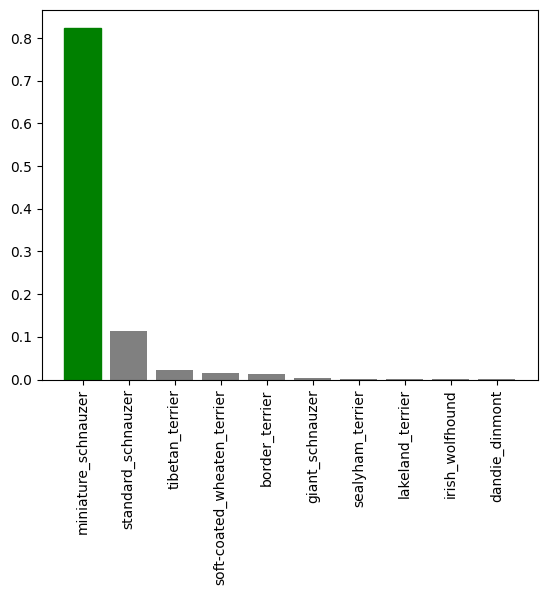

In [ ]:
plot_pred_conf(predictions, val_lab, n=77)

In [ ]:
names_predicted = []
for i in range (0,len(predictions)-1):
  pred = get_pred_label(predictions[i])
  names_predicted.append(pred)

In [ ]:
names_predicted

['entlebucher',
 'pomeranian',
 'west_highland_white_terrier',
 'schipperke',
 'lhasa',
 'pembroke',
 'great_pyrenees',
 'golden_retriever',
 'otterhound',
 'toy_poodle',
 'labrador_retriever',
 'vizsla',
 'otterhound',
 'german_short-haired_pointer',
 'saint_bernard',
 'italian_greyhound',
 'blenheim_spaniel',
 'pembroke',
 'great_dane',
 'tibetan_terrier',
 'curly-coated_retriever',
 'greater_swiss_mountain_dog',
 'scottish_deerhound',
 'scottish_deerhound',
 'kuvasz',
 'gordon_setter',
 'japanese_spaniel',
 'pug',
 'saluki',
 'scotch_terrier',
 'boxer',
 'chesapeake_bay_retriever',
 'japanese_spaniel',
 'schipperke',
 'bouvier_des_flandres',
 'cardigan',
 'chihuahua',
 'saluki',
 'tibetan_terrier',
 'cairn',
 'lhasa',
 'weimaraner',
 'kelpie',
 'redbone',
 'dhole',
 'groenendael',
 'dandie_dinmont',
 'cocker_spaniel',
 'italian_greyhound',
 'australian_terrier',
 'redbone',
 'pug',
 'chihuahua',
 'rottweiler',
 'schipperke',
 'chihuahua',
 'norfolk_terrier',
 'komondor',
 'bedlingto

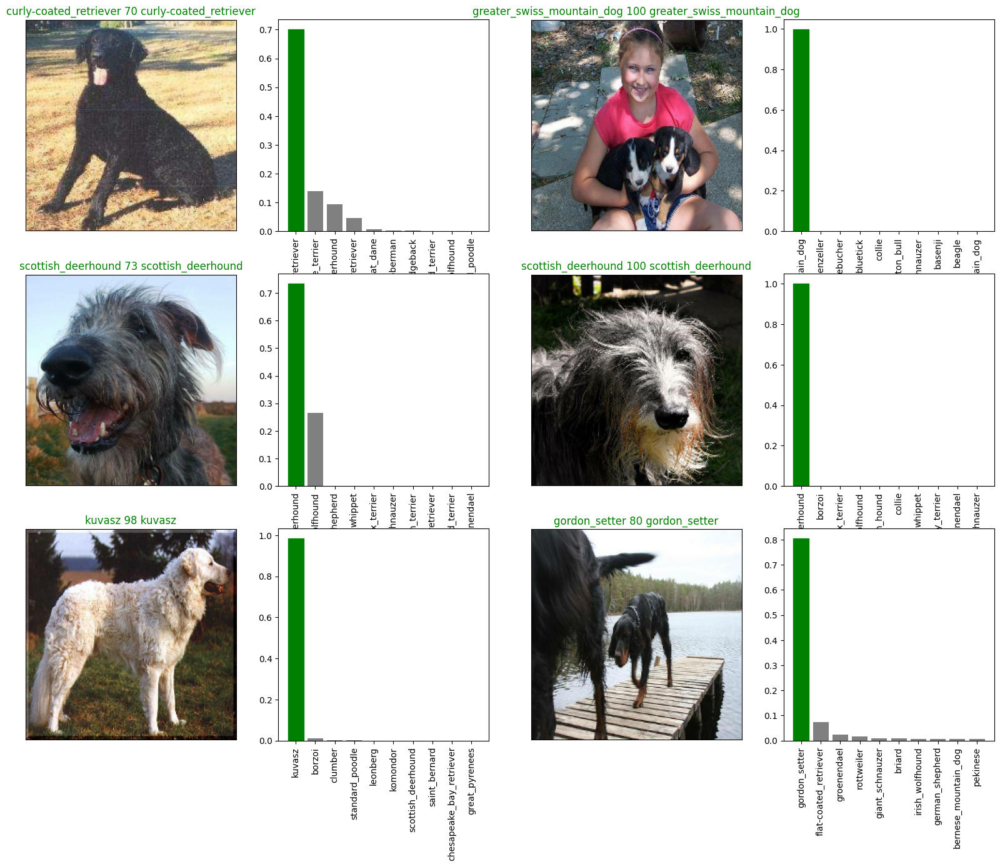

In [ ]:
i_multiplier = 20
num_rows = 3
num_cols=2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range (num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions, val_lab, val_img, n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions, val_lab, n = i+i_multiplier)
plt.show()

## Saving and reloding a model:

In [ ]:
def save_model(model, suffix=None):
  # create a model directory:
  modeldir= os.path.join("drive/MyDrive/Dog vision/models", datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" #save format for file is in .h5 extension
  print(f"saving model to {model_path}.....")
  model.save(model_path)
  return model_path

In [ ]:
# create function to load a trained model

def load_model(model_path):
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer": hub.KerasLayer})
  return model

Now we have functions to save and load, lets check if they work.

In [ ]:
# saved on 10000 images:

save_model(model, suffix="10000-images-mobilenetv2-Adam")

saving model to drive/MyDrive/Dog vision/models/20230516-06421684219370-10000-images-mobilenetv2-Adam.h5.....


'drive/MyDrive/Dog vision/models/20230516-06421684219370-10000-images-mobilenetv2-Adam.h5'

In [ ]:
# load a trained model:

load_10k_model = load_model("drive/MyDrive/Dog vision/models/20230516-06421684219370-10000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog vision/models/20230516-06421684219370-10000-images-mobilenetv2-Adam.h5


In [ ]:
model.evaluate(val_data)

63/63 [==============================] - 6s 92ms/step - loss: 0.6947 - accuracy: 0.8065


[0.6947125196456909, 0.8065000176429749]

In [ ]:
load_10k_model.evaluate(val_data)

63/63 [==============================] - 7s 110ms/step - loss: 0.6947 - accuracy: 0.8065


[0.6947125196456909, 0.8065000176429749]

## Training a big dog model (on full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# create a data batch with the full dataset:

full_data = create_data_batches(X,y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#  create a model for full model:

full_model = create_model()


In [ ]:
# create full model call backs:

full_model_tensorboard = create_tensorboard_callback()
# no validation set on training on all data hence cannot monitor on the early stopping callbacks:
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

**Note:** Running the cell below will take a little while.

It might take 30 to 40 minutes.

In [ ]:
# fit the full model to the full data:
full_model.fit(x=full_data, epochs = NUM_EPOCHS, callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 37s 103ms/step - loss: 1.3328 - accuracy: 0.6643
Epoch 2/100
320/320 [==============================] - 31s 98ms/step - loss: 0.3967 - accuracy: 0.8856
Epoch 3/100
320/320 [==============================] - 32s 100ms/step - loss: 0.2385 - accuracy: 0.9347
Epoch 4/100
320/320 [==============================] - 33s 102ms/step - loss: 0.1519 - accuracy: 0.9645
Epoch 5/100
320/320 [==============================] - 31s 98ms/step - loss: 0.1053 - accuracy: 0.9788
Epoch 6/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0761 - accuracy: 0.9866
Epoch 7/100
320/320 [==============================] - 31s 98ms/step - loss: 0.0574 - accuracy: 0.9925
Epoch 8/100
320/320 [==============================] - 32s 99ms/step - loss: 0.0449 - accuracy: 0.9954
Epoch 9/100
320/320 [==============================] - 32s 100ms/step - loss: 0.0313 - accuracy: 0.9964
Epoch 11/100
320/320 [==============================] - 32s 101ms/st

In [ ]:
save_model(model, suffix="full-model-mobilenetv2-Adam")

saving model to drive/MyDrive/Dog vision/models/20230516-07071684220851-full-model-mobilenetv2-Adam.h5.....


'drive/MyDrive/Dog vision/models/20230516-07071684220851-full-model-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model("drive/MyDrive/Dog vision/models/20230516-07071684220851-full-model-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog vision/models/20230516-07071684220851-full-model-mobilenetv2-Adam.h5


## Making predictions on the test dataset:

Since our model has been trained in the form of tensor batchs. To get a test result we have to turn the test data into similar format of batches.

To make predictions:
1. Get the test image filenames.
2. Convert the filenames into test data batches using the 'create_data_batches()' fucntion and setting the 'test_data' parameter to true since it does not have labels.
3. Make the prediction array by passing the test batched to the predict() method on our model.

In [ ]:
# load the test image file names:

test_path = "drive/MyDrive/Dog vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog vision/test/000621fb3cbb32d8935728e48679680e.jpg',
 'drive/MyDrive/Dog vision/test/00102ee9d8eb90812350685311fe5890.jpg',
 'drive/MyDrive/Dog vision/test/0012a730dfa437f5f3613fb75efcd4ce.jpg',
 'drive/MyDrive/Dog vision/test/001510bc8570bbeee98c8d80c8a95ec1.jpg',
 'drive/MyDrive/Dog vision/test/001a5f3114548acdefa3d4da05474c2e.jpg',
 'drive/MyDrive/Dog vision/test/00225dcd3e4d2410dd53239f95c0352f.jpg',
 'drive/MyDrive/Dog vision/test/002c2a3117c2193b4d26400ce431eebd.jpg',
 'drive/MyDrive/Dog vision/test/002c58d413a521ae8d1a5daeb35fc803.jpg',
 'drive/MyDrive/Dog vision/test/002f80396f1e3db687c5932d7978b196.jpg',
 'drive/MyDrive/Dog vision/test/0036c6bcec6031be9e62a257b1c3c442.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# create test data batch:
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling predict on our full model, and passing the test data batch will take a very long time to run. There are over 10k + images and it will take a fairly long time to upload on the gpu memory.

In [ ]:
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 33s 102ms/step


In [ ]:
np.savetxt("drive/MyDrive/Dog vision/preds_array.csv", test_predictions, delimiter=",")

This above command just saves the prediction in terms of the csv file.

In [ ]:
test_predictions = np.loadtxt("drive/MyDrive/Dog vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle:

Looking at the sample submission, we find that it wants our model prediction probability outputs in the dataframe with an id and a column for each different dog.

To prepare:
* Create a pandas dataframe with an ID column as well as a column for each of the dog breed.
* Add data to the Id column by extracting the test image id from their file paths.
* Add the prediction probabilities to each of the dig breeds columns
* Export the dataframe as a csv to submit it to kaggle

In [ ]:
preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# append test images id to prediction dataframs:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,00102ee9d8eb90812350685311fe5890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0012a730dfa437f5f3613fb75efcd4ce,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,001510bc8570bbeee98c8d80c8a95ec1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,001a5f3114548acdefa3d4da05474c2e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# add predictions probabilities to each dog breed column:

preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,1.566332e-07,6.013735e-08,3.099407e-10,4.852847e-10,4.110641e-09,5.635366e-09,6.441777e-11,8.596313e-10,1.032394e-09,...,6.171642e-08,2.118448e-09,1.615592e-09,8.258151e-10,1.589809e-10,1.188349e-08,1.352539e-09,1.598372e-09,1.597494e-07,7.366450e-09
1,00102ee9d8eb90812350685311fe5890,5.824876e-06,2.717630e-06,1.685914e-06,5.762004e-07,9.398726e-06,4.393762e-06,5.361963e-06,1.310450e-05,8.610776e-06,...,2.198685e-06,5.074242e-06,8.662795e-07,9.741003e-05,2.932414e-06,3.704636e-06,8.555578e-04,1.359858e-08,2.624789e-06,3.609286e-07
2,0012a730dfa437f5f3613fb75efcd4ce,6.045405e-10,9.307363e-06,5.348827e-06,4.565499e-09,6.154363e-09,4.105604e-06,5.403404e-08,6.773322e-10,2.145483e-07,...,7.771268e-10,1.003818e-09,2.320347e-07,1.763214e-05,3.621495e-07,2.583024e-06,3.451265e-09,2.992683e-05,1.929853e-07,1.819592e-08
3,001510bc8570bbeee98c8d80c8a95ec1,8.765765e-04,3.120374e-04,4.955506e-06,1.312074e-06,1.167005e-05,1.935954e-07,2.339105e-09,5.716552e-07,1.744921e-05,...,5.232895e-06,1.515023e-09,1.956409e-05,1.076695e-07,2.956787e-05,4.698256e-07,3.269143e-11,1.985807e-02,9.489677e-09,1.135281e-05
4,001a5f3114548acdefa3d4da05474c2e,8.430588e-05,3.416738e-05,8.959768e-07,7.394216e-09,9.923031e-08,6.449620e-09,2.806841e-07,1.103236e-07,3.676946e-08,...,1.752092e-06,2.592032e-09,1.718191e-08,6.936902e-09,3.147447e-08,7.516032e-09,4.193415e-09,8.282697e-06,1.157241e-07,1.555351e-06


In [ ]:
# save our predictions dataframe to Kaggle.
preds_df.to_csv("drive/MyDrive/Dog vision/full_model_predictions_submissions_1_mobile_netv2.csv", index=False)

## Making predictions on custom images:

To make predictions:
* get file path of our images
* turn the file path into data batches, since images wont have labels then the test_data param will be True
* Pass the custom images to out predict() method
* Convert the prediction output probabilities to prediction labels.
* Compare predicted labels to custom images.

In [ ]:
custom_path = "drive/MyDrive/Dog vision/my-dog-photos/"
custom_image_path = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_path

['drive/MyDrive/Dog vision/my-dog-photos/mau1.jpg',
 'drive/MyDrive/Dog vision/my-dog-photos/mau4.jpg',
 'drive/MyDrive/Dog vision/my-dog-photos/mau3.jpg',
 'drive/MyDrive/Dog vision/my-dog-photos/mau2.jpg']

In [ ]:
# turn custom images into data batches
custom_data = create_data_batches(custom_image_path, test_data = True)


Creating test data batches...


In [ ]:
# make predictions:

custom_preds = loaded_full_model.predict(custom_data)

custom_preds

1/1 [==============================] - 1s 633ms/step


array([[5.47124657e-08, 2.53674352e-06, 2.76236539e-03, 2.83188712e-07,
        2.57821433e-04, 1.71574683e-07, 5.97170029e-08, 8.92659227e-05,
        3.88387660e-03, 2.20574642e-04, 1.79237086e-05, 7.25356830e-10,
        5.76138591e-05, 3.75632681e-09, 2.22814979e-05, 2.07878981e-09,
        3.05364239e-07, 7.32324770e-05, 3.97741275e-07, 1.31534468e-02,
        4.17726476e-08, 2.96463259e-05, 2.58191358e-06, 8.65091453e-04,
        1.35957606e-07, 1.28621587e-05, 1.27192225e-05, 1.42472982e-05,
        4.08104999e-04, 1.64399017e-02, 9.56782515e-07, 3.63600906e-04,
        4.90998427e-05, 6.74644639e-07, 1.17861859e-07, 3.86110088e-07,
        3.77826873e-05, 3.98215830e-01, 1.41685541e-06, 3.51930225e-07,
        1.27255248e-06, 9.08697118e-09, 2.91554847e-09, 1.64512268e-04,
        1.28727124e-05, 2.10217142e-04, 1.42868987e-06, 1.69568992e-07,
        1.71400920e-08, 5.88484945e-05, 3.19989510e-08, 1.06860447e-04,
        6.29039391e-07, 4.48366518e-05, 2.79762986e-07, 2.131122

In [ ]:
custom_preds.shape

(4, 120)

In [ ]:
# get custom image prediction labels

custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range (len(custom_preds))]
custom_pred_labels

['mexican_hairless', 'eskimo_dog', 'rhodesian_ridgeback', 'sealyham_terrier']

In [ ]:
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

ValueError: ignored

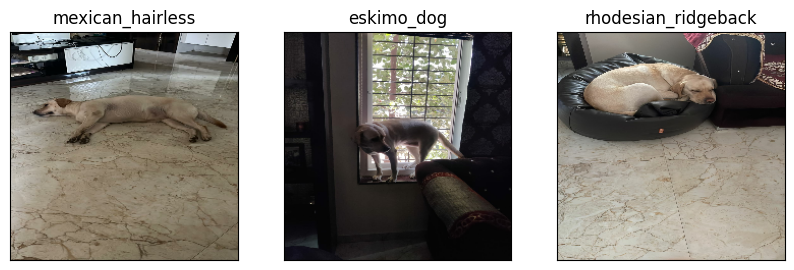

In [ ]:
# check custom image predictions:
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)